In [0]:
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql import SparkSession, Window
from pyspark.sql.functions import col, explode, split, coalesce, lit, regexp_extract, when, last, first
import pandas as pd
import matplotlib.pyplot as plt

In [0]:
# Initialize Spark session with Spark NLP
spark = SparkSession.builder \
    .appName("Spark NLP Test") \
    .config("spark.jars.packages", "com.johnsnowlabs.nlp:spark-nlp_2.12:5.5.2") \
    .getOrCreate()

In [0]:
spark = SparkSession.builder.getOrCreate()
companies = spark.read.parquet('/dbfs/linkedin_train_data')
employees = spark.read.parquet('/dbfs/linkedin_people_train_data')

In [0]:
employees = employees\
    .where('experience is not null')\
    .where('size(experience)>0')\
    .where('education is not null')\
    .where('size(education)>0')

In [0]:
from pyspark.sql.functions import col, posexplode, expr

employees_in_jobs = employees\
    .select("*", posexplode(col("experience")).alias("pos", "current_comp"))\
    .withColumn("past_experience", expr("slice(experience, 1, pos)"))\
    .drop("experience")

employees_in_jobs = employees_in_jobs.withColumn("duration", col("current_comp.duration"))


In [0]:
employees_in_jobs = employees_in_jobs.withColumn("years", regexp_extract(col("duration"), r"(\d+)\s+year", 1).cast("int"))
employees_in_jobs = employees_in_jobs.withColumn("months", regexp_extract(col("duration"), r"(\d+)\s+month", 1).cast("int"))
employees_in_jobs = employees_in_jobs.fillna({"years": 0, "months": 0})
employees_in_jobs = employees_in_jobs.withColumn(
    "moreThanYear",
    when(col("years") >= 1, 1).otherwise(0)
)

# Preprocessing

In [0]:
from pyspark.sql.functions import median, avg, col, size

In [0]:
university_path = '/Workspace/Users/dan_amler@campus.technion.ac.il/university_data.csv'
universities = spark.read.csv(f"file://{university_path}", header=True, inferSchema=True)
exploded_df = employees.withColumn("University", explode(col("education.title")))\
    .select("id", "University")\
    .join(universities, on="University", how="left")
education_data = exploded_df.groupBy("id").agg(
    avg("Acceptance Rate").alias("mean_acceptance_rate"),
    avg("Graduation Rate").alias("mean_graduation_rate"),
    avg("Avg Cost After Aid").alias("mean_avg_cost_after_aid"))
education_data = education_data.select("id", "mean_acceptance_rate", "mean_graduation_rate", "mean_avg_cost_after_aid")

education_data.display()

id,mean_acceptance_rate,mean_graduation_rate,mean_avg_cost_after_aid
maitesa,null,0.68,43000.0
christinedonovan3,0.78,0.84,22000.0
jillian-ancona-817733a8,0.68,0.63,18000.0
jack-j-lesyk-ph-d-cmpc-3b3b0b6,0.27,0.84,38000.0
diane-phalen-97390952,0.77,0.64,14000.0
jennifer-roth-o-keefe-a446b352,0.78,0.84,22000.0
kaelyn-lemon-52a391105,0.28,0.91,23000.0
ryan-clifton-84915233,0.74,0.67,14000.0
jennaleeallen,0.79,0.65,12000.0
ryan-dolfi242b92171,0.23,0.88,3679.0


In [0]:
exploded_past = employees_in_jobs.withColumn("past_duration", explode(col("past_experience.duration_short")))
exploded_past = exploded_past.withColumn("past_job_years", regexp_extract(col("past_duration"), r"(\d+)\s+year", 1).cast("int"))
exploded_past = exploded_past.withColumn("past_job_months", regexp_extract(col("past_duration"), r"(\d+)\s+month", 1).cast("int"))
exploded_past = exploded_past.fillna({"past_job_years": 0, "past_job_months": 0})
exploded_past = exploded_past.withColumn("total_past_months", col("past_job_years") * 12 + col("past_job_months"))
average_past_months = exploded_past.groupBy("id", "past_experience").agg(avg("total_past_months").alias("avg_past_months")).select("id", "past_experience", "avg_past_months")
average_past_months.display()

id past_experience avg_past_months goktuggeneci List(List(Lockheed Martin, lockheed-martin, null, 3 years 3 months, null, null, null, List(List(null, Aug 2023 - Present 2 months, 2 months, Present, Aug 2023 - Present2 months , Syracuse, New York, United States, Aug 2023, Lockheed Martin, Software Engineer Sr), List(null, Mar 2022 Aug 2023 1 year 6 months, 1 year 6 months, Aug 2023, Mar 2022 - Aug 20231 year 6 months , Syracuse, New York, United States, Mar 2022, Lockheed Martin, Software Engineer), List(null, Jul 2020 Mar 2022 1 year 9 months, 1 year 9 months, Mar 2022, Jul 2020 - Mar 20221 year 9 months , Syracuse, New York, United States, Jul 2020, Lockheed Martin, Software Engineer Asc)), null, null, null, null, https://sa.linkedin.com/company/lockheed-martin?trk=public_profile_experience-group-header)) 0.0 sadi-jones-46894a228 List(List(Safeway, safeway, null, 1 year 4 months, null, null, null, List(List(null, Aug 2023 - Present 2 months, 2 months, Present, Aug 2023 - Present2 months , United States, Aug 2023, Safeway, Asset Protection Investigator), List(null, Jun 2022 Aug 2023 1 year 3 months, 1 year 3 months, Aug 2023, Jun 2022 - Aug 20231 year 3 months, Jun 2022, Safeway, Asset Protection Specialist)), null, null, null, null, https://www.linkedin.com/company/safeway?trk=public_profile_experience-group-header), List(null, null, null, Apr 2023 Jun 2023 3 months, 3 months, Jun 2023, null, null, Apr 2023, Community Alternatives of El Paso County, null, Case Manager, null), List(null, null, null, Sep 2019 Dec 2022 3 years 4 months, 3 years 4 months, Dec 2022, Colorado Springs, Colorado, United States, null, Sep 2019, Ross Stores, Inc., https://www.linkedin.com/company/ross-stores?trk=public_profile_experience-item_profile-section-card_subtitle-click, Front End Supervisor/Manager on Duty, null)) 14.333333333333334 peter-klinkenberg-dds-a830b161 List(List(null, null, null, Sep 2020 - Present 3 years 1 month, 3 years 1 month, Present, null, null, Sep 2020, Relaxation Dentistry, https://www.linkedin.com/company/relaxation-dentistry?trk=public_profile_experience-item_profile-section-card_subtitle-click, Associate Dentist, null), List(null, null, null, 2014 2015 1 year, 1 year, 2015, null, null, 2014, University of Minnesota, https://www.linkedin.com/company/university-of-minnesota?trk=public_profile_experience-item_profile-section-card_subtitle-click, Teaching Specialist, null)) 24.5 luci-marlowe-bb870a147 List(List(null, null, null, Apr 2016 - Present 7 years 6 months, 7 years 6 months, Present, New York, United States, null, Apr 2016, Dance/NYC LLP, null, Dance Instructor, null)) 90.0 jamie-gamboa-a779752b List(List(null, null, • Manages a training program for predoctoral students and unlicensed master's level clinicians • Provides individual and group supervision to trainees • Creates educational content for trainees and facilitates weekly didactic training • Manages a training program for predoctoral students and unlicensed master's level clinicians • Provides individual and group supervision to trainees • Creates educational content for trainees and facilitates weekly didactic training, Aug 2022 - Present 1 year 2 months, 1 year 2 months, Present, Rancho Cucamonga, California, United States, null, Aug 2022, Simple Solutions Psychotherapy, null, Clinical Training Supervisor, null), List(null, null, • Provides individual, couples, and group therapy to adults in an outpatient private practice setting • Conducts intakes and assigns diagnoses • Charts client progress • Provides individual supervision to predoctoral and postdoctoral trainee • Provides individual and group supervision to trainees co-facilitating group therapy • Manages and coordinates Framework’s group therapy program • Develops group materials • Facilitates three virtual psychoeducational and experiential groups for adults: o The Mindful Path for Depression & Anxiety o Refocus for ADHD (Levels 1 and 2) o LGBTQIA+ Support group Show less, Oct 2021 - Present 2 year

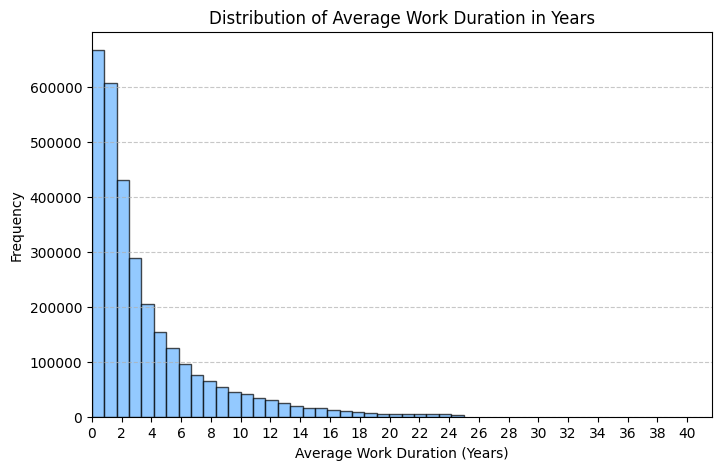

In [0]:
import matplotlib.pyplot as plt

# Convert Spark DataFrame to Pandas (assuming full_data_filled contains work durations)
work_duration_pd = average_past_months.select("avg_past_months").toPandas()

# Convert months to years
work_duration_pd["avg_past_years"] = work_duration_pd["avg_past_months"] / 12
filtered_work_duration_pd = work_duration_pd[work_duration_pd["avg_past_years"] < 25]


# Plot histogram with x-axis in years
plt.figure(figsize=(8, 5))
plt.hist(filtered_work_duration_pd["avg_past_years"], bins=30, color="#66B3FF", edgecolor="black", alpha=0.7)
plt.xlabel("Average Work Duration (Years)")
plt.ylabel("Frequency")
plt.title("Distribution of Average Work Duration in Years")
plt.xlim(0, 500 / 12)  # Limit x-axis to 500 months converted to years
plt.xticks(range(0, 42, 2))  # Adjust x-axis ticks for better readability
plt.grid(axis="y", linestyle="--", alpha=0.7)  # Adding grid lines for better readability
plt.show()


In [0]:
full_data = employees_in_jobs.join(education_data, on="id", how="left").join(average_past_months, on=["id", "past_experience"], how="left")\
    .select(
  "moreThanYear", 
  "mean_acceptance_rate",
  "mean_graduation_rate",
  "mean_avg_cost_after_aid",
  "current_comp.title",
  "current_comp.subtitle",
  "avg_past_months",
  when(col("recommendations_count").isNotNull(), col("recommendations_count")).\
    otherwise(0).alias("recommendations_count"),
  size("education").alias("num_education"),
  size("past_experience").alias("num_past_experience"))

Filling missing data

In [0]:
numeric_cols = ["mean_acceptance_rate", "mean_graduation_rate", "mean_avg_cost_after_aid", "num_past_experience", "num_education", "avg_past_months"]
mean_values = full_data.select(
    *[median(col(c)).alias(f"median_{c}") for c in numeric_cols]
).collect()[0]
fill_dict = {c: mean_values[f"median_{c}"] for c in numeric_cols}
full_data_filled = full_data.na.fill(fill_dict)
for c in numeric_cols:
    df_filled = full_data_filled.withColumn(
        c,
        when(col(c).rlike("^[0-9]+(\\.[0-9]*)?$"), col(c))  # Keep numeric values
        .otherwise(None)  # Replace non-numeric with null
        .cast("float")  # Convert to float
    )

In [0]:
df_filled.display()

moreThanYear,mean_acceptance_rate,mean_graduation_rate,mean_avg_cost_after_aid,title,subtitle,avg_past_months,recommendations_count,num_education,num_past_experience
1,0.73,0.69,16000.0,Engineer Intern,Murat Özer İnşaat,6.0,0,1,1
1,0.73,0.69,16000.0,Lecturer spartnership manager,OHI-S,25.714285,0,1,0
0,0.73,0.69,16000.0,Summer Associate,Milbank LLP,25.714285,0,2,0
0,0.73,0.69,16000.0,International trade manager,"Hangzhou Fanbo textile Co,lt",25.714285,0,1,0
1,0.73,0.69,16000.0,执行董事,深圳市前海亿翔汇投资控股有限公司,77.75,0,1,4
1,0.73,0.69,16000.0,null,null,25.714285,0,1,0
1,0.73,0.69,16000.0,null,null,0.0,0,4,1
1,0.73,0.69,16000.0,Artist,.jnkjn.,25.714285,0,1,0
0,0.45,0.86,18000.0,Systems Administrator,Legal Services Corporation,25.714285,0,1,0
0,0.73,0.69,16000.0,Industrial & Interior Designer,Rahat Mobilya,23.0,0,5,2


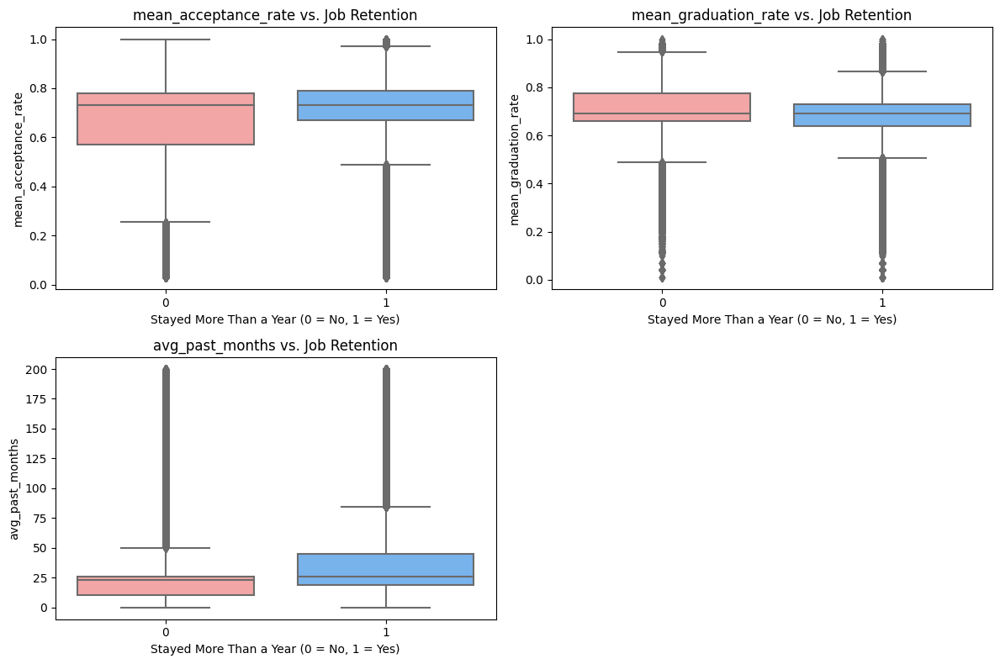

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter out extreme values in avg_past_months (limit to 200)
filtered_spark_df = df_filled.filter(df_filled.avg_past_months <= 200)

# Select relevant columns and convert to Pandas
pdf = filtered_spark_df.select(["moreThanYear", "mean_acceptance_rate", "mean_graduation_rate", "avg_past_months"]).toPandas()

# Define numerical features for visualization
features = ["mean_acceptance_rate", "mean_graduation_rate", "avg_past_months"]

# Create boxplots for each feature
plt.figure(figsize=(12, 8))
for i, feature in enumerate(features, 1):  # Skip "moreThanYear"
    plt.subplot(2, 2, i)
    sns.boxplot(x="moreThanYear", y=feature, data=pdf, palette=["#FF9999", "#66B3FF"])
    plt.xlabel("Stayed More Than a Year (0 = No, 1 = Yes)")
    plt.ylabel(feature)
    plt.title(f"{feature} vs. Job Retention")
plt.tight_layout()
plt.show()


In [0]:
import numpy as np
from pyspark.ml import Pipeline
from pyspark.sql import DataFrame
from pyspark.sql.functions import udf, col
from pyspark.sql.types import ArrayType, FloatType
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.linalg import VectorUDT, Vectors
from sparknlp.base import DocumentAssembler
from sparknlp.annotator import Tokenizer, WordEmbeddingsModel, LemmatizerModel


class SparkNLPPreprocessorStatic:
    """
    A single class that:
    1. Builds a Spark NLP pipeline to create GloVe embeddings for each specified text column.
    2. Pools (averages) token embeddings to produce a single vector per row/column.
    3. Converts arrays to Spark ML dense vectors.
    4. Combines text vectors (and optional numeric columns) into a `features` column.
    """
    
    def __init__(
        self, 
        embedding_model: str = "glove_100d", 
        text_cols: list = None, 
        numeric_cols: list = None, 
        output_col: str = "features"
    ):
        """
        :param embedding_model: Name of the pretrained GloVe model, e.g., "glove_100d", "glove_300d", etc.
        :param text_cols: List of string columns to embed. Defaults to None.
        :param numeric_cols: List of numeric columns to include in the final feature vector. Defaults to None.
        :param output_col: Name of the final assembled features column. Defaults to "features".
        """
        self.embedding_model_name = embedding_model
        self.text_cols = text_cols or []
        self.numeric_cols = numeric_cols or []
        self.output_col = output_col
        
        self.pipeline = None
        self._avg_emb_udf = None
        self._to_vec_udf = None

        # Prepare the UDFs needed for manual pooling
        self._create_udfs()
    
    def _create_pipeline_stages(self):
        """
        Creates Spark NLP pipeline stages for each text column:
          - DocumentAssembler
          - Tokenizer
          - GloVe WordEmbeddingsModel
        """
        stages = []
        for col_name in self.text_cols:
            assembler = DocumentAssembler() \
                .setInputCol(col_name) \
                .setOutputCol(f"{col_name}_document")

            tokenizer = Tokenizer() \
                .setInputCols([f"{col_name}_document"]) \
                .setOutputCol(f"{col_name}_tokens")

                # Add Lemmatizer
            lemmatizer = LemmatizerModel.pretrained("lemma_antbnc", "en") \
                .setInputCols([f"{col_name}_tokens"]) \
                .setOutputCol(f"{col_name}_lemmas")
            
                

            embeddings = WordEmbeddingsModel.pretrained(self.embedding_model_name, "en") \
                .setInputCols([f"{col_name}_document", f"{col_name}_lemmas"]) \
                .setOutputCol(f"{col_name}_embeddings")

            stages += [assembler, tokenizer, lemmatizer, embeddings]
        return stages

    def build_pipeline(self):
        """
        Builds the Spark NLP pipeline (DocumentAssembler, Tokenizer, WordEmbeddingsModel) 
        for each text column.
        """
        stages = self._create_pipeline_stages()
        self.pipeline = Pipeline(stages=stages)

    def _create_udfs(self):
        """
        Creates the UDFs required for:
          1. Averaging token embeddings (array of annotation structs -> array of floats)
          2. Converting array of floats -> Spark ML dense vector
        """
        
        # 1) UDF to average token embeddings
        def average_embeddings(annotations):
            """
            annotations: list of annotation structs (each has .embeddings = array[float]).
            Returns a single average embedding array for that row/column.
            """
            if not annotations:
                return []
            vectors = [anno.embeddings for anno in annotations if anno.embeddings is not None]
            if not vectors:
                return []
            arr = np.array(vectors)
            avg_vec = arr.mean(axis=0)
            return avg_vec.tolist()
        
        self._avg_emb_udf = udf(average_embeddings, ArrayType(FloatType()))

        # 2) UDF to convert float arrays -> DenseVector
        def to_dense_vector(float_array):
            return Vectors.dense(float_array) if float_array else Vectors.dense([])
        
        self._to_vec_udf = udf(to_dense_vector, VectorUDT())

    def fit_transform(self, df: DataFrame) -> DataFrame:
        """
        1) Fits the Spark NLP pipeline on the DataFrame (generates token-level embeddings).
        2) Manually averages those embeddings for each text column.
        3) Converts arrays into Spark ML vectors.
        4) Uses VectorAssembler to create a final features column: <self.output_col>.
        
        Returns a new DataFrame with a "features" column + original columns (including `moreThanYear`).
        """
        if not self.pipeline:
            raise ValueError("Pipeline has not been built. Call build_pipeline() first.")
        
        # 1) Run the pipeline to produce *_embeddings columns
        model = self.pipeline.fit(df)
        embedded_df = model.transform(df)

        # 2) For each text column, average the token-level embeddings
        pooled_df = embedded_df
        for col_name in self.text_cols:
            pooled_df = pooled_df.withColumn(
                f"{col_name}_vec_array",
                self._avg_emb_udf(col(f"{col_name}_embeddings"))
            )
        
        # 3) Convert each array of floats into Spark ML DenseVector
        for col_name in self.text_cols:
            pooled_df = pooled_df.withColumn(
                f"{col_name}_vec",
                self._to_vec_udf(col(f"{col_name}_vec_array"))
            )

        # 4) Assemble text vectors + numeric columns into a single features vector
        assembler_input = [f"{c}_vec" for c in self.text_cols] + self.numeric_cols
        assembler = VectorAssembler(
            inputCols=assembler_input,
            outputCol=self.output_col
        )
        final_df = assembler.transform(pooled_df)

        return final_df


In [0]:
preprocessor = SparkNLPPreprocessorStatic(
    text_cols=["title", "subtitle"],
    numeric_cols=["mean_acceptance_rate", "mean_graduation_rate", "mean_avg_cost_after_aid", "num_past_experience", "num_education", "recommendations_count", "avg_past_months"]
)

preprocessor.build_pipeline()
final_df = preprocessor.fit_transform(full_data_filled)
final_df = final_df.filter(
    "title IS NOT NULL AND TRIM(title) != '' "
    "AND subtitle IS NOT NULL AND TRIM(subtitle) != '' "
)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-9006594411631881>, line 1
----> 1 preprocessor = SparkNLPPreprocessorStatic(
      2     text_cols=["title", "subtitle"],
      3     numeric_cols=["mean_acceptance_rate", "mean_graduation_rate", "mean_avg_cost_after_aid", "num_past_experience", "num_education", "recommendations_count", "avg_past_months"]
      4 )
      6 preprocessor.build_pipeline()
      7 final_df = preprocessor.fit_transform(full_data_filled)

NameError: name 'SparkNLPPreprocessorStatic' is not defined

## Training

In [0]:
from pyspark.sql.functions import udf, col
from pyspark.sql.types import FloatType
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import BinaryClassificationEvaluator


# Filter dataset to exclude nulls
df_no_null = final_df

# Calculate total count and class-specific counts
total_count = df_no_null.count()
class_counts = df_no_null.groupBy("moreThanYear").count().rdd.collectAsMap()

# Calculate weights
weights = {k: total_count / (2.0 * v) for k, v in class_counts.items()}
print(f"Class weights: {weights}")

# Define UDF to map weights
def calculate_weight(more_than_year):
    return float(weights[more_than_year])

weight_udf = udf(calculate_weight, FloatType())

# Add weight column
df_no_null = df_no_null.withColumn("classWeight", weight_udf(col("moreThanYear")))

# Split data into train (80%) and test (20%)
train_df, test_df = df_no_null.randomSplit([0.8, 0.2], seed=42)

# Logistic Regression
lr = LogisticRegression(featuresCol="features", labelCol="moreThanYear", weightCol="classWeight")
model = lr.fit(train_df)

Class weights: {1: 0.6931196725997658, 0: 1.7945340919157253}


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

## Weights

In [0]:
coefficients = model.coefficients
intercept = model.intercept
print("Coefficients:", coefficients)
print("Intercept:", intercept)

print()
for c, val in zip(["mean_acceptance_rate", "mean_graduation_rate", "mean_avg_cost_after_aid", "num_past_experience", "num_education", "recommendations_count", "avg_past_months"], coefficients[-7:]):
    print(f"{c}: {val}")

Coefficients: [-0.19016786061606736,0.04607678198521645,0.13727917790819652,-0.012063263463609858,0.24998926652558576,0.4022551303192071,-0.37107507907789156,-0.022178587482883594,-0.13313650401943009,0.11371250336024631,0.03209513057842547,-0.011245362820007309,0.2554338946105187,0.18837921677118452,0.07771447327420757,-0.4570003944490313,-0.03131716572778161,-0.127271831700933,-0.09951082069788908,0.16513211518469978,0.11668221211690592,0.08396222542005308,0.18795485358270267,0.11029790778901499,-0.10433670751402353,0.20857430980537534,-0.1511258262968372,0.250247416217938,-0.10850835927854939,0.04196976516032362,0.0037631534308714583,0.17801363924379746,-0.2527459387030527,0.4242260662553403,0.08281943601472126,-0.1161938533990695,-0.02576685717770489,-0.07884875787950192,-0.15303368547556884,-0.018254740952527857,0.2695173811796615,0.03694760945943539,0.45533081341410375,-0.06291111555796151,0.027675786104185644,0.0583471067906068,-0.03520935383885326,-0.06234935544120909,-0.153728

## Evaluating

In [0]:
# Make predictions on test data
predictions = model.transform(test_df)

In [0]:
s

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-9006594411631901>, line 1
----> 1 s

NameError: name 's' is not defined

In [0]:
evaluator = BinaryClassificationEvaluator(labelCol="moreThanYear", rawPredictionCol="rawPrediction")
auc = evaluator.evaluate(predictions)
print(f"AUC on Test Data: {auc}")

AUC on Test Data: 0.7179113811839932


In [0]:
count_11 = predictions.filter((col("moreThanYear") == 1) & (col("prediction") == 1)).count()
count_10 = predictions.filter((col("moreThanYear") == 1) & (col("prediction") == 0)).count()
count_01 = predictions.filter((col("moreThanYear") == 0) & (col("prediction") == 1)).count()
count_00 = predictions.filter((col("moreThanYear") == 0) & (col("prediction") == 0)).count()

print(count_11, count_10, count_01, count_00)

370966 172577 78432 131635


In [0]:
# calculate the F1 metric
precision = count_11 / (count_11 + count_10)
recall = count_11 / (count_11 + count_01)
f1 = 2 * (precision * recall) / (precision + recall)
f1

0.7472065309016346

In [0]:
#calculate accuracy
accuracy = (count_11 + count_00) / (count_11 + count_10 + count_01 + count_00)
accuracy

0.6669245365640053